In [1]:
from google.colab import drive
drive.mount("/content/drive", force_remount=True)

Mounted at /content/drive


In [2]:
!pip install tensorflow-gpu==1.15

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [7]:
!pip install tensorflow==1.15

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 412.3 MB 29 kB/s 
  Attempting uninstall: tensorflow
    Found existing installation: tensorflow 2.8.2+zzzcolab20220527125636
    Uninstalling tensorflow-2.8.2+zzzcolab20220527125636:
      Successfully uninstalled tensorflow-2.8.2+zzzcolab20220527125636
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
kapre 0.3.7 requires tensorflow>=2.0.0, but you have tensorflow 1.15.0 which is incompatible.


In [2]:
!pip show tensorflow
!pip show tensorflow-gpu

Name: tensorflow
Version: 1.15.0
Summary: TensorFlow is an open source machine learning framework for everyone.
Home-page: https://www.tensorflow.org/
Author: Google Inc.
Author-email: packages@tensorflow.org
License: Apache 2.0
Location: /usr/local/lib/python3.7/dist-packages
Requires: grpcio, termcolor, astor, keras-applications, six, keras-preprocessing, gast, tensorboard, numpy, wheel, opt-einsum, absl-py, protobuf, tensorflow-estimator, google-pasta, wrapt
Required-by: kapre
Name: tensorflow-gpu
Version: 1.15.0
Summary: TensorFlow is an open source machine learning framework for everyone.
Home-page: https://www.tensorflow.org/
Author: Google Inc.
Author-email: packages@tensorflow.org
License: Apache 2.0
Location: /usr/local/lib/python3.7/dist-packages
Requires: keras-applications, termcolor, opt-einsum, tensorflow-estimator, six, keras-preprocessing, numpy, wrapt, grpcio, astor, absl-py, gast, protobuf, tensorboard, wheel, google-pasta
Required-by: 


In [4]:
!nvcc -V   

nvcc: NVIDIA (R) Cuda compiler driver
Copyright (c) 2005-2018 NVIDIA Corporation
Built on Sat_Aug_25_21:08:01_CDT_2018
Cuda compilation tools, release 10.0, V10.0.130


In [13]:
!nvidia-smi

NVIDIA-SMI has failed because it couldn't communicate with the NVIDIA driver. Make sure that the latest NVIDIA driver is installed and running.



In [10]:
#Uninstall the current CUDA version
!apt-get --purge remove cuda nvidia* libnvidia-*
!dpkg -l | grep cuda- | awk '{print $2}' | xargs -n1 dpkg --purge
!apt-get remove cuda-*
!apt autoremove
!apt-get update

Reading package lists... Done
Building dependency tree       
Reading state information... Done
Note, selecting 'nvidia-kernel-common-418-server' for glob 'nvidia*'
Note, selecting 'nvidia-325-updates' for glob 'nvidia*'
Note, selecting 'nvidia-346-updates' for glob 'nvidia*'
Note, selecting 'nvidia-driver-binary' for glob 'nvidia*'
Note, selecting 'nvidia-331-dev' for glob 'nvidia*'
Note, selecting 'nvidia-304-updates-dev' for glob 'nvidia*'
Note, selecting 'nvidia-compute-utils-418-server' for glob 'nvidia*'
Note, selecting 'nvidia-384-dev' for glob 'nvidia*'
Note, selecting 'nvidia-libopencl1-346-updates' for glob 'nvidia*'
Note, selecting 'nvidia-fs-prebuilt' for glob 'nvidia*'
Note, selecting 'nvidia-driver-440-server' for glob 'nvidia*'
Note, selecting 'nvidia-340-updates-uvm' for glob 'nvidia*'
Note, selecting 'nvidia-dkms-450-server' for glob 'nvidia*'
Note, selecting 'nvidia-kernel-common' for glob 'nvidia*'
Note, selecting 'nvidia-kernel-source-440-server' for glob 'nvidia*'


In [13]:
!sudo apt-key adv --keyserver keyserver.ubuntu.com --recv-keys A4B469963BF863CC
# Download and install CUDA 10.0
!wget  --no-clobber https://developer.download.nvidia.com/compute/cuda/repos/ubuntu1804/x86_64/cuda-repo-ubuntu1804_10.0.130-1_amd64.deb
#install CUDA kit dpkg
!dpkg -i cuda-repo-ubuntu1804_10.0.130-1_amd64.deb
!sudo apt-key adv --fetch-keys https://developer.download.nvidia.com/compute/cuda/repos/ubuntu1804/x86_64/7fa2af80.pub
!apt-get update
!apt-get install cuda-10-0 
!apt --fix-broken install

Executing: /tmp/apt-key-gpghome.161LliPerK/gpg.1.sh --keyserver keyserver.ubuntu.com --recv-keys A4B469963BF863CC
gpg: key A4B469963BF863CC: public key "cudatools <cudatools@nvidia.com>" imported
gpg: Total number processed: 1
gpg:               imported: 1
File ‘cuda-repo-ubuntu1804_10.0.130-1_amd64.deb’ already there; not retrieving.

(Reading database ... 118225 files and directories currently installed.)
Preparing to unpack cuda-repo-ubuntu1804_10.0.130-1_amd64.deb ...
Unpacking cuda-repo-ubuntu1804 (10.0.130-1) over (10.0.130-1) ...
Setting up cuda-repo-ubuntu1804 (10.0.130-1) ...
Executing: /tmp/apt-key-gpghome.fFZmJOTu2D/gpg.1.sh --fetch-keys https://developer.download.nvidia.com/compute/cuda/repos/ubuntu1804/x86_64/7fa2af80.pub
gpg: requesting key from 'https://developer.download.nvidia.com/compute/cuda/repos/ubuntu1804/x86_64/7fa2af80.pub'
gpg: key F60F4B3D7FA2AF80: "cudatools <cudatools@nvidia.com>" not changed
gpg: Total number processed: 1
gpg:              unchanged: 1
Get

In [14]:
!nvcc --version

nvcc: NVIDIA (R) Cuda compiler driver
Copyright (c) 2005-2018 NVIDIA Corporation
Built on Sat_Aug_25_21:08:01_CDT_2018
Cuda compilation tools, release 10.0, V10.0.130


In [3]:
%cd /content/drive/MyDrive/Single Shot Detection/SSD-Tensorflow-On-Custom-Dataset

/content/drive/MyDrive/Single Shot Detection/SSD-Tensorflow-On-Custom-Dataset


In [22]:
!python split_train_test.py

In [23]:
!python xmltotfrecords_conversion.py



W0626 15:32:19.502759 140399593039744 module_wrapper.py:139] From xmltotfrecords_conversion.py:152: The name tf.gfile.Exists is deprecated. Please use tf.io.gfile.exists instead.


W0626 15:32:19.505812 140399593039744 module_wrapper.py:139] From xmltotfrecords_conversion.py:166: The name tf.python_io.TFRecordWriter is deprecated. Please use tf.io.TFRecordWriter instead.

converting image1 / 40 \ n with_headphone.012388f4-e423-11ec-abec-f889d283f7d6
Instructions for updating:
Use tf.gfile.GFile.
W0626 15:32:19.509015 140399593039744 deprecation.py:323] From xmltotfrecords_conversion.py:51: FastGFile.__init__ (from tensorflow.python.platform.gfile) is deprecated and will be removed in a future version.
Instructions for updating:
Use tf.gfile.GFile.
converting image2 / 40 \ n with_headphone.02596530-e423-11ec-831d-f889d283f7d6
converting image3 / 40 \ n with_headphone.03906812-e423-11ec-af86-f889d283f7d6
converting image4 / 40 \ n with_headphone.04c6b026-e423-11ec-b842-f889d283f7d6
con

In [4]:
!python train_ssd_network.py --train_dir=log/ --dataset_name=pascalvoc_2007 --dataset_split_name=train --model_name=ssd_300_vgg --save_summaries_secs=60 --save_interval_secs=600 --weight_decay=0.0005 --optimizer=adam --learning_rate=0.001 --batch_size=2 --max_number_of_steps=500 --gpu_memory_fraction=0.9 --checkpoint_exclude_scopes =ssd_300_vgg/conv6,ssd_300_vgg/conv7,ssd_300_vgg/block8,ssd_300_vgg/block9,ssd_300_vgg/block10,ssd_300_vgg/block11,ssd_300_vgg/block4_box,ssd_300_vgg/block7_box,ssd_300_vgg/block8_box,ssd_300_vgg/block9_box,ssd_300_vgg/block10_box,ssd_300_vgg/block11_box

The TensorFlow contrib module will not be included in TensorFlow 2.0.
For more information, please see:
  * https://github.com/tensorflow/community/blob/master/rfcs/20180907-contrib-sunset.md
  * https://github.com/tensorflow/addons
  * https://github.com/tensorflow/io (for I/O related ops)
If you depend on functionality not listed there, please file an issue.



W0626 17:55:33.066504 139851047266176 module_wrapper.py:139] From train_ssd_network.py:192: The name tf.logging.set_verbosity is deprecated. Please use tf.compat.v1.logging.set_verbosity instead.


W0626 17:55:33.066719 139851047266176 module_wrapper.py:139] From train_ssd_network.py:192: The name tf.logging.DEBUG is deprecated. Please use tf.compat.v1.logging.DEBUG instead.

Instructions for updating:
Please switch to tf.train.create_global_step
W0626 17:55:33.067531 139851047266176 deprecation.py:323] From train_ssd_network.py:204: create_global_step (from tensorflow.contrib.framework.python.ops.variables) is deprecated and 

In [5]:
import os
import math
import random

import numpy as np
import tensorflow as tf
import cv2

import warnings
warnings.filterwarnings("ignore")

slim = tf.contrib.slim

The TensorFlow contrib module will not be included in TensorFlow 2.0.
For more information, please see:
  * https://github.com/tensorflow/community/blob/master/rfcs/20180907-contrib-sunset.md
  * https://github.com/tensorflow/addons
  * https://github.com/tensorflow/io (for I/O related ops)
If you depend on functionality not listed there, please file an issue.



In [6]:
%matplotlib inline
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

In [7]:
import sys
sys.path.append('../')

In [8]:
import visualization
from nets import ssd_vgg_300, ssd_common, np_methods
from preprocessing import ssd_vgg_preprocessing

In [9]:
# TensorFlow session: grow memory when needed. TF, DO NOT USE ALL MY GPU MEMORY!!!
gpu_options = tf.GPUOptions(allow_growth=True)
config = tf.ConfigProto(log_device_placement=False, gpu_options=gpu_options)
isess = tf.InteractiveSession(config=config)

## SSD 300 Model

The SSD 300 network takes 300x300 image inputs. In order to feed any image, the latter is resize to this input shape (i.e.`Resize.WARP_RESIZE`). Note that even though it may change the ratio width / height, the SSD model performs well on resized images (and it is the default behaviour in the original Caffe implementation).

SSD anchors correspond to the default bounding boxes encoded in the network. The SSD net output provides offset on the coordinates and dimensions of these anchors.

In [10]:
# Input placeholder.
net_shape = (300, 300)
data_format = 'NHWC'
img_input = tf.placeholder(tf.uint8, shape=(None, None, 3))

# Evaluation pre-processing: resize to SSD net shape.
image_pre, labels_pre, bboxes_pre, bbox_img = ssd_vgg_preprocessing.preprocess_for_eval(
    img_input, None, None, net_shape, data_format, resize=ssd_vgg_preprocessing.Resize.WARP_RESIZE)
image_4d = tf.expand_dims(image_pre, 0)

# Define the SSD model.
reuse = True if 'ssd_net' in locals() else None
ssd_net = ssd_vgg_300.SSDNet()
with slim.arg_scope(ssd_net.arg_scope(data_format=data_format)):
    predictions, localisations, _, _ = ssd_net.net(image_4d, is_training=False, reuse=reuse)


Instructions for updating:
Use `tf.cast` instead.


Instructions for updating:
Please use `layer.__call__` method instead.
Instructions for updating:
Use keras.layers.dropout instead.


In [13]:
# Restore SSD model.
ckpt_filename = 'log/model.ckpt-502'

isess.run(tf.global_variables_initializer())

saver = tf.train.Saver()

saver.restore(isess, ckpt_filename)

# SSD default anchor boxes.
ssd_anchors = ssd_net.anchors(net_shape)

INFO:tensorflow:Restoring parameters from log/model.ckpt-502


## Post-processing pipeline

The SSD outputs need to be post-processed to provide proper detections. Namely, we follow these common steps:

* Select boxes above a classification threshold;
* Clip boxes to the image shape;
* Apply the Non-Maximum-Selection algorithm: fuse together boxes whose Jaccard score > threshold;
* If necessary, resize bounding boxes to original image shape.

In [14]:
# Main image processing routine.
def process_image(img, select_threshold=0.502, nms_threshold=.45, net_shape=(300, 300)):
    # Run SSD network.
    rimg, rpredictions, rlocalisations, rbbox_img = isess.run([image_4d, predictions, localisations, bbox_img],
                                                              feed_dict={img_input: img})
    
    # Get classes and bboxes from the net outputs.
    rclasses, rscores, rbboxes = np_methods.ssd_bboxes_select(
            rpredictions, rlocalisations, ssd_anchors,
            select_threshold=select_threshold, img_shape=net_shape, num_classes=21, decode=True)
    
    rbboxes = np_methods.bboxes_clip(rbbox_img, rbboxes)
    rclasses, rscores, rbboxes = np_methods.bboxes_sort(rclasses, rscores, rbboxes, top_k=400)
    rclasses, rscores, rbboxes = np_methods.bboxes_nms(rclasses, rscores, rbboxes, nms_threshold=nms_threshold)
    

    rbboxes = np_methods.bboxes_resize(rbbox_img, rbboxes)
    return rclasses, rscores, rbboxes

In [15]:
import cv2
# Test on some demo image and visualize output.
path = 'VOC2007/JPEGImages/'
image_names = sorted(os.listdir(path))
image_names

['with_headphone.012388f4-e423-11ec-abec-f889d283f7d6.jpg',
 'with_headphone.02596530-e423-11ec-831d-f889d283f7d6.jpg',
 'with_headphone.03906812-e423-11ec-af86-f889d283f7d6.jpg',
 'with_headphone.04c6b026-e423-11ec-b842-f889d283f7d6.jpg',
 'with_headphone.05fcbb46-e423-11ec-98e9-f889d283f7d6.jpg',
 'with_headphone.0733f0f6-e423-11ec-8ca0-f889d283f7d6.jpg',
 'with_headphone.0869dd9c-e423-11ec-b2c3-f889d283f7d6.jpg',
 'with_headphone.d0f991c8-ec71-11ec-a2f7-f889d283f7d6.jpg',
 'with_headphone.d2319dcc-ec71-11ec-ba13-f889d283f7d6.jpg',
 'with_headphone.d36785ec-ec71-11ec-9ad9-f889d283f7d6.jpg',
 'with_headphone.d49e7662-ec71-11ec-aa8e-f889d283f7d6.jpg',
 'with_headphone.d5d63830-ec71-11ec-86fe-f889d283f7d6.jpg',
 'with_headphone.d70db1c0-ec71-11ec-a13f-f889d283f7d6.jpg',
 'with_headphone.d8441762-ec71-11ec-8cac-f889d283f7d6.jpg',
 'with_headphone.d97a0a02-ec71-11ec-9426-f889d283f7d6.jpg',
 'with_headphone.dab0bdb6-ec71-11ec-a219-f889d283f7d6.jpg',
 'with_headphone.dbe821f4-ec71-11ec-b390

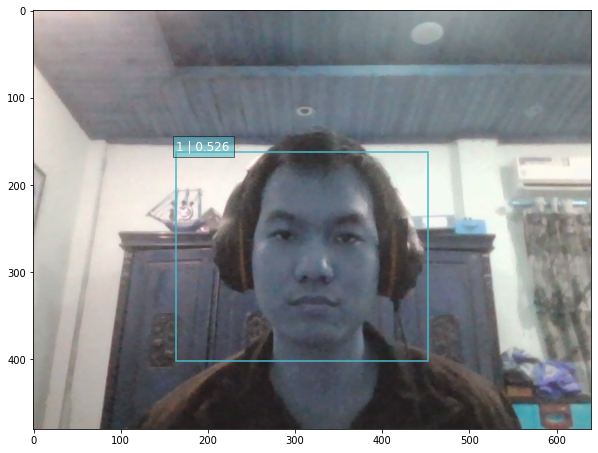

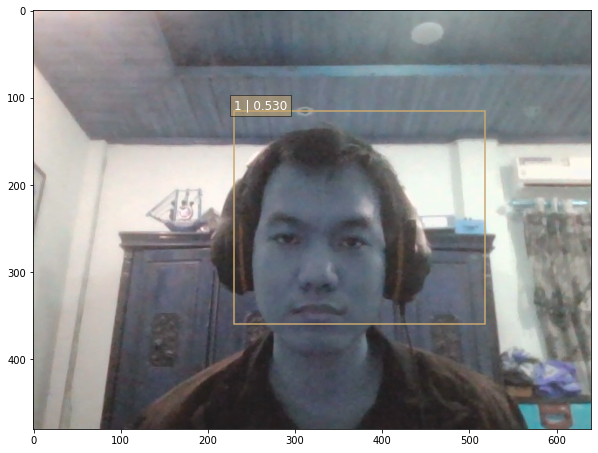

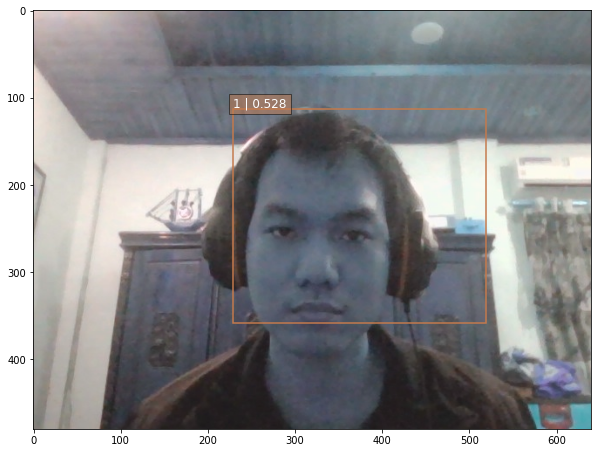

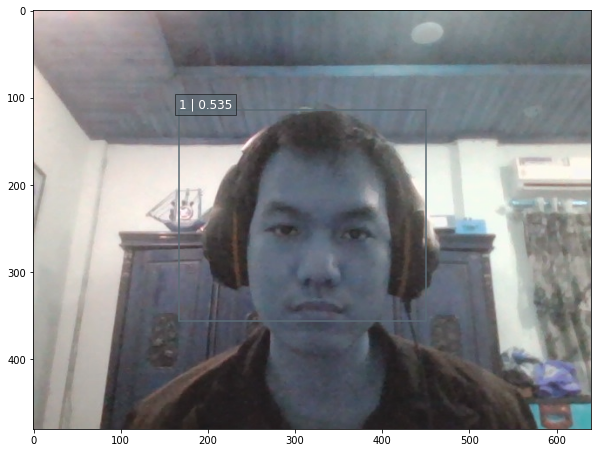

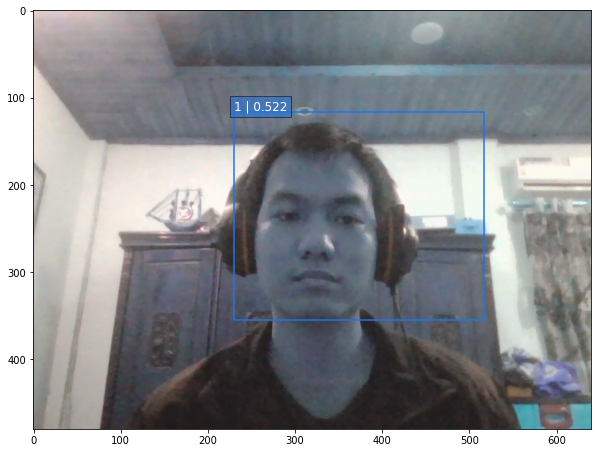

...

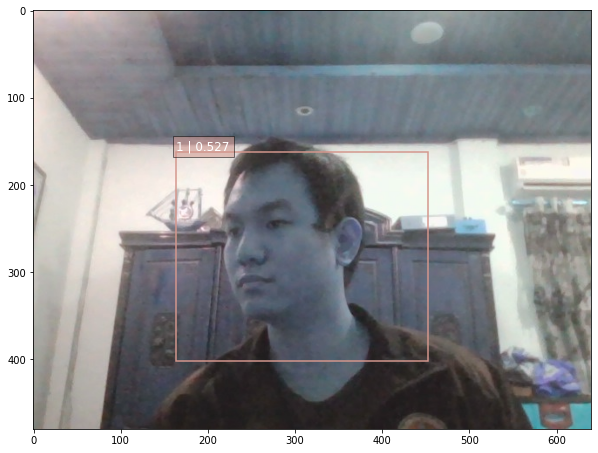

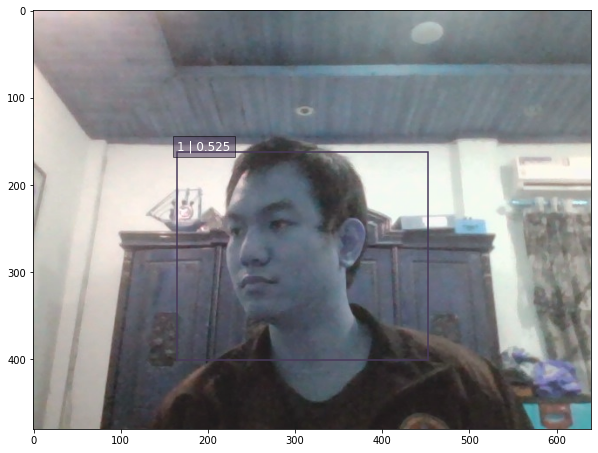

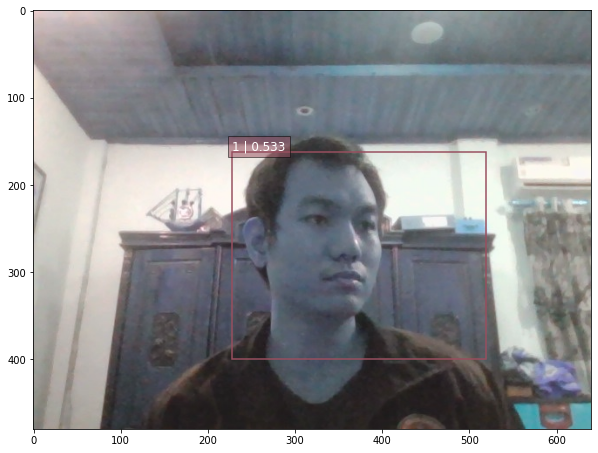

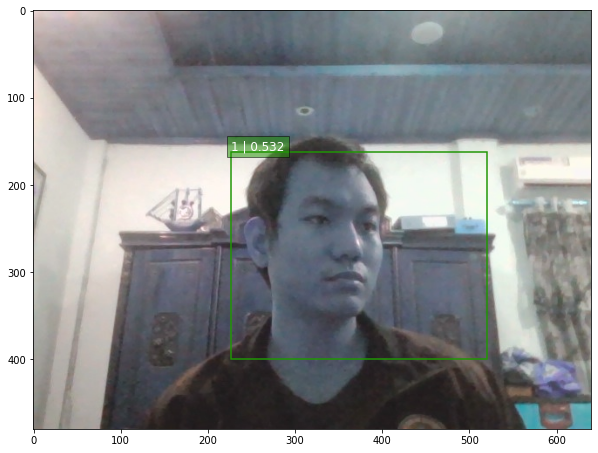

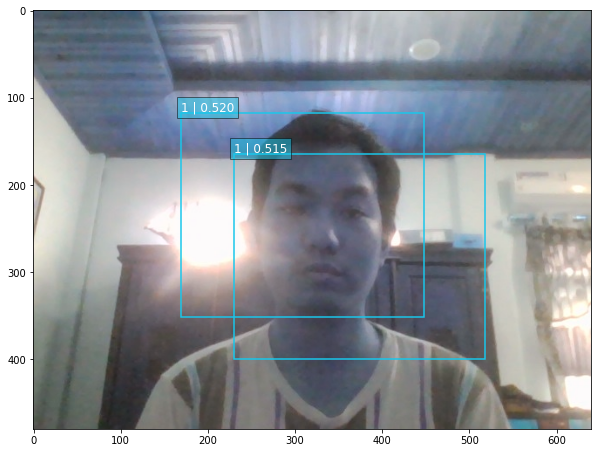

In [21]:
#img = mpimg.imread(path + image_names[-2])
for i in range(0, 40):
  img = cv2.imread(path + image_names[i])

  rclasses, rscores, rbboxes =  process_image(img)

  visualization.plt_bboxes(img, rclasses, rscores, rbboxes)